In [321]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math

from tslearn.clustering import TimeSeriesKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, \
    TimeSeriesResampler
from minisom import MiniSom

#### Read Time series Data

In [93]:
df = pd.read_csv('data.txt', sep=" ", header=None)
df

,0,1,2,3,4,5,6,7,8,9,...,4358,4359,4360,4361,4362,4363,4364,4365,4366,4367
0,-1.786785,-1.759306,-1.731826,-1.657497,-1.504801,-1.303554,-1.099353,-0.939600,-0.834307,-0.642136,...,0.806520,0.842348,0.743352,0.572553,0.394154,0.236707,0.127456,0.124078,0.266715,0.494930
1,-1.696926,-1.589682,-1.482438,-1.438186,-1.504610,-1.668164,-1.880164,-2.012606,-1.950127,-1.707242,...,0.816715,0.736486,0.683914,0.606173,0.432088,0.194261,-0.057964,-0.312055,-0.565359,-0.817930
2,0.152293,-0.001868,-0.156029,-0.260148,-0.283644,-0.273770,-0.282275,-0.301053,-0.309397,-0.296038,...,0.744458,0.848834,0.797598,0.611185,0.326360,0.000687,-0.303251,-0.523594,-0.621051,-0.645872
3,-0.951338,-1.038791,-1.126245,-1.259050,-1.456028,-1.629866,-1.693202,-1.664615,-1.575958,-1.406233,...,0.487786,0.574832,0.558728,0.570994,0.724730,0.867772,0.837370,0.693679,0.533052,0.373722
4,-1.117863,-1.209420,-1.300976,-1.335880,-1.282855,-1.212149,-1.186737,-1.139009,-0.997874,-0.808915,...,0.674229,0.712476,0.649029,0.493149,0.270269,0.047190,-0.111916,-0.194744,-0.208145,-0.183737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-1.476726,-1.384780,-1.292834,-1.316479,-1.520947,-1.770050,-1.916043,-1.966382,-1.949685,-1.824007,...,0.524595,0.629315,0.769022,0.837379,0.742844,0.522179,0.223564,-0.187463,-0.742874,-1.382051
96,-0.147306,-0.628073,-1.108839,-1.478275,-1.658697,-1.707026,-1.701723,-1.672829,-1.605088,-1.350490,...,0.803852,1.014642,1.108927,1.038618,0.787709,0.439469,0.089793,-0.214186,-0.450071,-0.645637
97,-1.459160,-1.487654,-1.516149,-1.488817,-1.382944,-1.308259,-1.363864,-1.473904,-1.517791,-1.370945,...,0.368506,0.518264,0.741340,0.945640,1.016281,0.891805,0.565214,0.193923,-0.069454,-0.255923
98,-1.636396,-1.735798,-1.835200,-1.902854,-1.915313,-1.882320,-1.817190,-1.714326,-1.560443,-1.330420,...,0.387744,0.291293,0.328930,0.477352,0.680531,0.842687,0.885235,0.838111,0.751590,0.648769


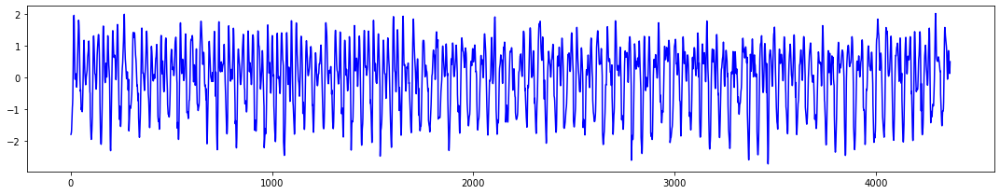

In [596]:
plt.rcParams["figure.figsize"] = [15, 3]
plt.rcParams["figure.autolayout"] = True
x = np.array([i for i in range(1, 4369)])
y = df.iloc[0]
plt.plot(x, y,color = "b")
plt.show()

### Passer à l'échelle journalière

In [95]:
ts_days = df.groupby(df.columns//48, axis=1).sum()

In [96]:
ts_days.shape

(100, 91)

New distribution

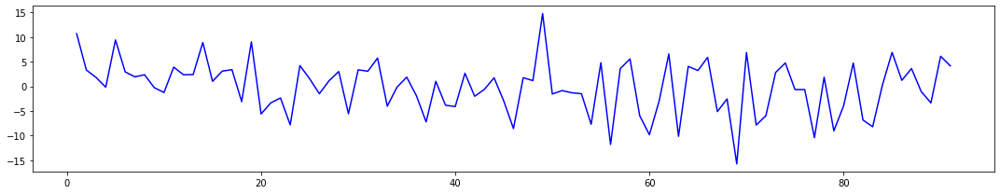

In [597]:
plt.rcParams["figure.figsize"] = [15, 3]
plt.rcParams["figure.autolayout"] = True
x = np.array([i for i in range(1, 92)])
y = ts_days.iloc[0]
plt.plot(x, y,color = "b")
plt.show()

Decomposition d'une serie temporelle (y(t) = Level + Trend + Seasonality + Noise) (2eme serie comme exemple)

In [839]:
from pylab import rcParams
from statsmodels.tsa.seasonal import seasonal_decompose

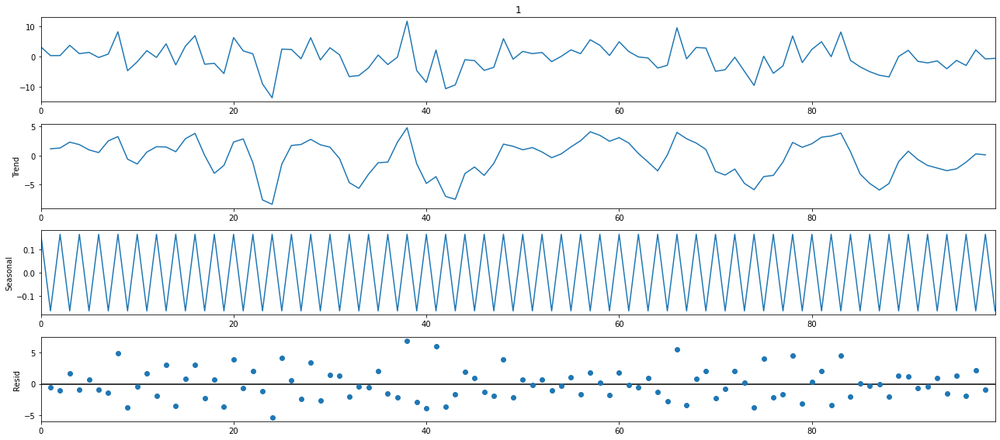

<Figure size 5600x2400 with 0 Axes>

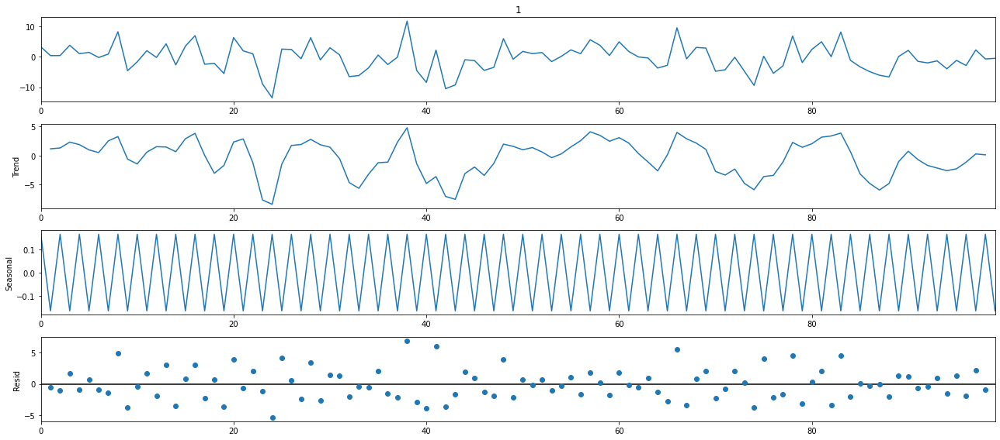

In [840]:
rcParams['figure.figsize'] = 18, 8
plt.figure(figsize=(70, 30), dpi=80)
ser = ts_days[1]
res = seasonal_decompose(ser, model='additive', period = 2)
res.plot()

In [841]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.ar_model import AutoReg

**Graphiques d'autocorrélation et d'autocorrélation partielle Les graphiques d'autocorélation montrent comment les valeurs au temps t sont corrélées avec les valeurs suivantes au temps t+1,t+2,..t+n. Si les données ne sont pas stationnaires, les valeurs d'autocorrélation seront fortement corrélées avec des points distants dans le temps montrant des saisonnalités ou des tendances possibles.**

**Les valeurs d'autocorrélation des séries stationnaires diminueront rapidement au cours du temps t. Cela nous montre qu'aucune information n'est reportée dans le temps et que la série doit alors être constante dans le temps.**

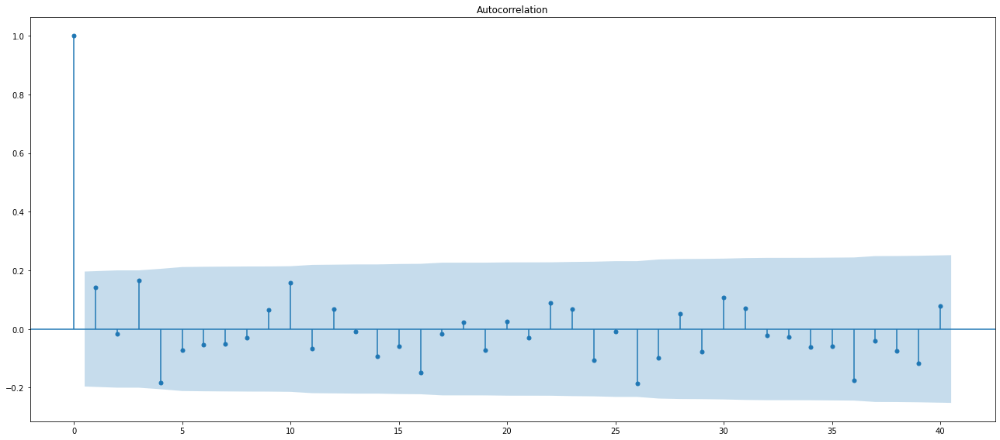

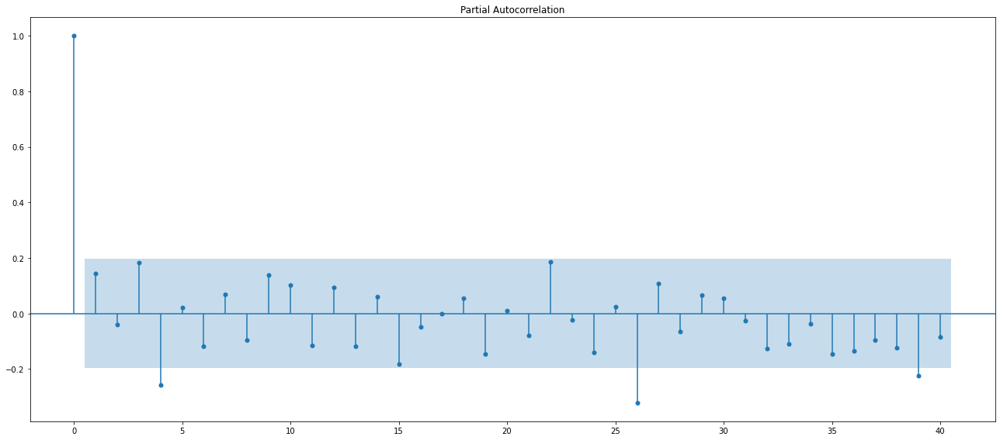

In [842]:
plot_acf(ser, lags=40)
plot_pacf(ser, lags=40)
plt.show()

**Test pour verifier la stationnarité des series :**

* **Hypothèse nulle (H0)** : si elle n'est pas rejetée, cela suggère que la série chronologique a une racine unitaire, ce qui signifie qu'elle est non stationnaire. Il a une structure dépendante du temps.


* **Hypothèse alternative (H1)** : L'hypothèse nulle est rejetée ; cela suggère que la série chronologique n'a pas de racine unitaire, ce qui signifie qu'elle est stationnaire.

In [844]:
X = ser.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical values:')
for k, val in result[4].items():
    print('\t%s: %.3f' % (k, val))

ADF Statistic: -5.302997
p-value: 0.000005
Critical values:
	1%: -3.500
	5%: -2.892
	10%: -2.583


D'ou la serie est stationnaire,car p_value < 0,05 d'une part, et d'autre part la mesure ADF statistic est inferieur a la valeur critique, donc on peut effectuer notre traitement (on a verifié la stationnarité des autres series)

**Smoothing average**

Nous parlions de la façon dont notre moyenne et notre écart type devraient être constants dans le temps afin d'avoir une série temporelle stationnaire,

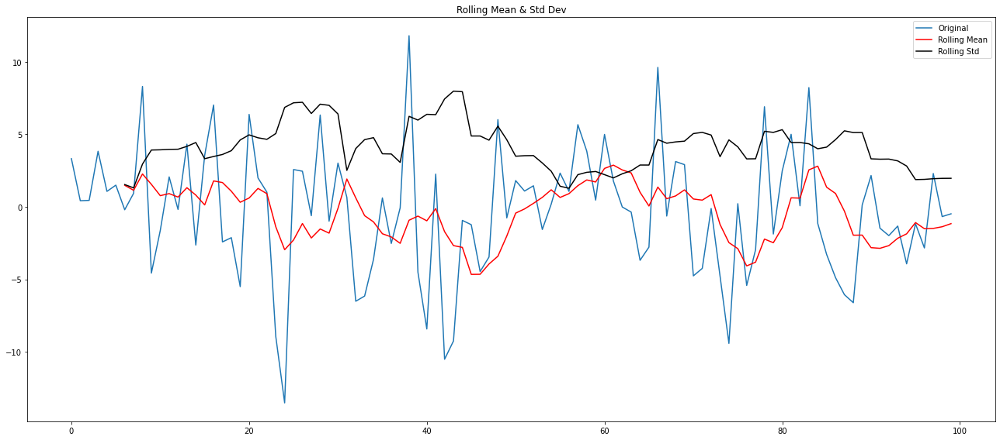

In [845]:

rm = ser.rolling(window=7).mean()
rs = ser.rolling(window=7).std()

# Plotting time ! 
orig = plt.plot(ser, label='Original')
mean = plt.plot(rm, color='red', label='Rolling Mean')
std = plt.plot(rs, color='black', label='Rolling Std')
plt.legend()
plt.title('Rolling Mean & Std Dev')
plt.show()

### Visualisation
Let's visualize some time series from our dataset

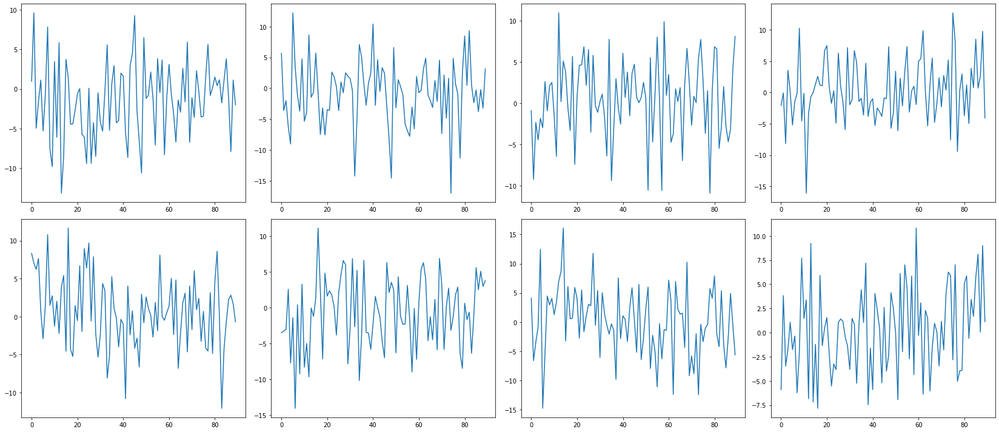

In [849]:
fig, axs = plt.subplots(2,4,figsize=(23,10))

for i in range(2):
    r = random.randint(0, 100)
    axs[i, 0].plot(ts_days.iloc[r,0:-1])
    r = random.randint(0, 100)
    axs[i, 1].plot(ts_days.iloc[r,0:-1])
    r = random.randint(0, 100)
    axs[i, 2].plot(ts_days.iloc[r,0:-1])
    r = random.randint(0, 100)
    axs[i, 3].plot(ts_days.iloc[r,0:-1])

plt.show()

Let's compare some time series

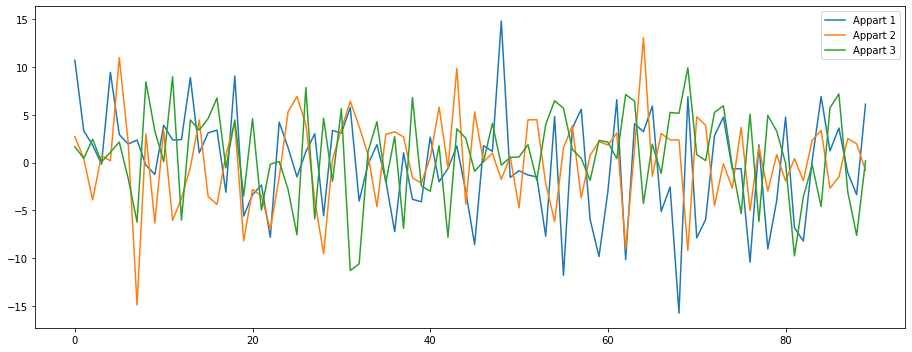

In [639]:
f = plt.figure(figsize=(25,5))
ax = f.add_subplot(121)
ax.plot((ts_days.iloc[0,0:-1]), label='Appart 1')
ax.plot((ts_days.iloc[1,0:-1]), label='Appart 2')
ax.plot((ts_days.iloc[2,0:-1]), label='Appart 3')
ax.legend()
plt.show()

Dans les premiers jours, on remarque que l'appartement 2 (orange) consomme moins d'éléctricité, et l'appartement 1 (bleu) consomme le plus. En revanche, à partir de 50ème jours l'appartement 1 commence à consommer le moins d'éléctricité. Ainsi qu'on remarque que l'appartement 3 (vert) est presque la plus stable dans la consomamation tout au long des 91 jrs.

### Preprocessing

In [129]:
ts_days.shape

(100, 91)

In [134]:
df.isnull().sum().sum()

0

We have any missing values

We will scale our time series (centre-reduit)

In [985]:
# we will scale our time series (centre-reduit)
X_train = TimeSeriesScalerMeanVariance().fit_transform(ts_days)

In [986]:
X_train.shape

(100, 91, 1)

## Clustering

**Dans cette partie nous allons faire une classification automatique des times series, on va commencer par un :**

* K-Means  : Metrics = ( Dynamic time warping && Euclidian Distance )
* SOM (Self-organizing maps)
* CAH (clustering ascendant hiérarchique)
* ACP + K-Means

**Pour chaque modèle, nous allons effectuer le clustering, calculer le nombre de chaque classe et trouver le nombre optimal de cluster en utilisant le ElboW.**

**NB  : Dans toutes les étapes on a choisi de travailler avec les données centrées-réduites**

### 1- K-means
**1-1 Dynamic time warping (DTW) distance  :**

In [988]:
# A good rule of thumb is choosing k as the square root of the number of points in the training data set
cluster_count = math.ceil(math.sqrt(len(X_train))) 

km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(X_train)

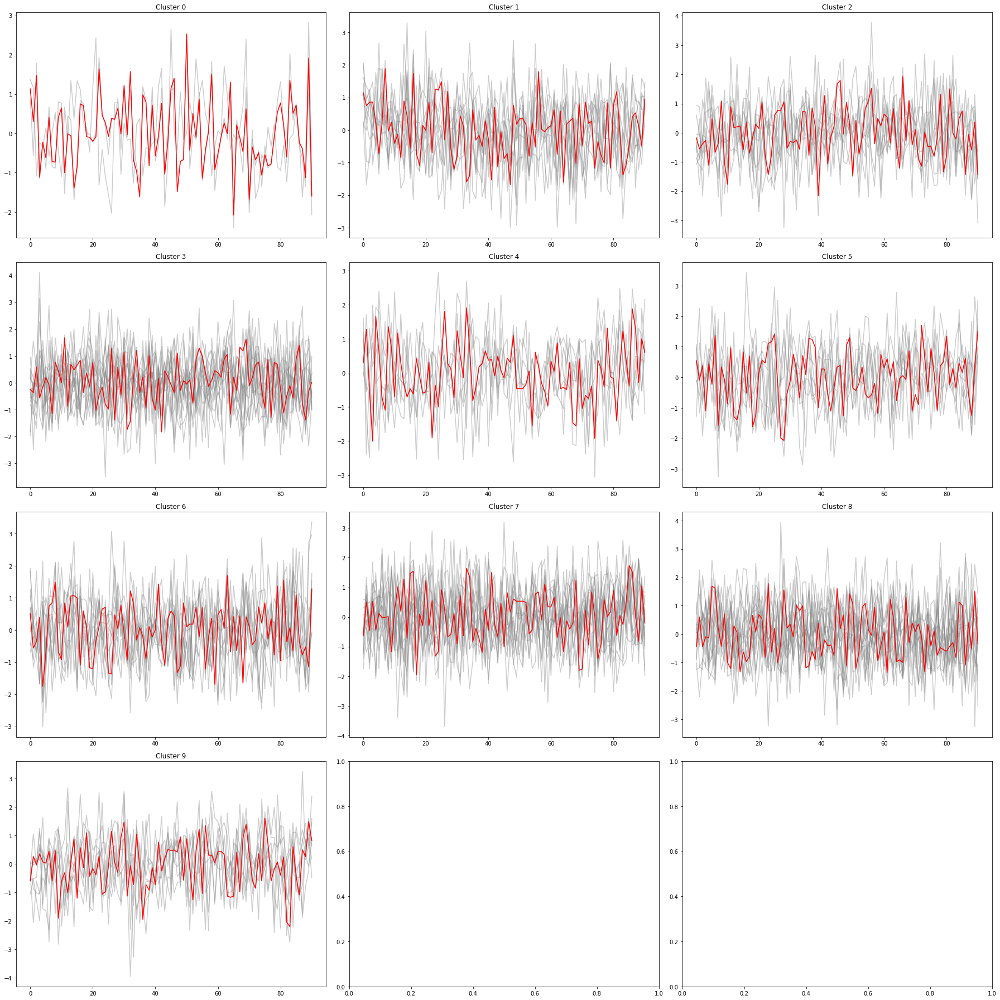

In [989]:
fig, axs = plt.subplots(4,3,figsize=(25,25))
#fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(X_train[i],c="gray",alpha=0.4)
                cluster.append(X_train[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(km.cluster_centers_[row_i*3+column_j].ravel(), "r-")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*3+column_j))
    column_j+=1
    if column_j%3 == 0:
        row_i+=1
        column_j=0
        
plt.show()

**==> Dans les figures ci-dessus, on a affiché les series temporelles appartenant à chaque classe en gris et le rouge représente le centre de chaque cluster**

**La distribution des classes**

In [789]:
labels

array([7, 3, 9, 5, 6, 6, 4, 4, 6, 9, 8, 4, 8, 8, 2, 5, 7, 3, 5, 0, 0, 4,
       4, 1, 9, 8, 7, 4, 1, 9, 2, 5, 6, 0, 4, 1, 4, 3, 6, 2, 0, 9, 4, 6,
       4, 4, 5, 4, 8, 3, 3, 7, 6, 8, 7, 4, 4, 0, 8, 4, 4, 2, 7, 9, 6, 5,
       4, 5, 5, 7, 9, 4, 2, 5, 0, 4, 8, 8, 6, 8, 4, 5, 8, 5, 0, 6, 3, 2,
       6, 4, 3, 5, 8, 5, 0, 5, 4, 5, 4, 1], dtype=int64)

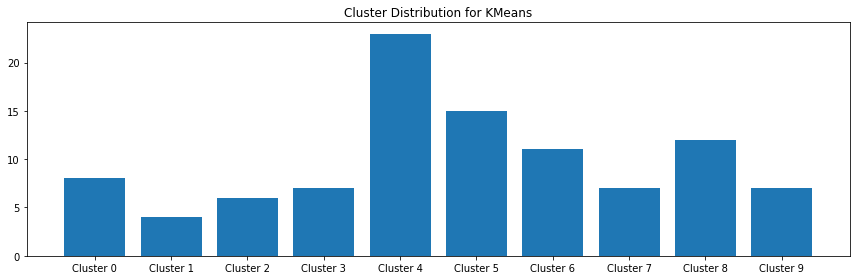

In [790]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(12,4))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

**Nous allons créé une nouvelle dataset en ajoutant la variable cluster**

In [830]:
df_cluster = pd.DataFrame(data = X_train[:,:,0])
df_cluster['cluster'] = labels
df_cluster.cluster.unique()

array([7, 3, 9, 5, 6, 4, 8, 2, 0, 1], dtype=int64)

In [835]:

c1 = df_cluster[df_cluster['cluster']==0]
c2 = df_cluster[df_cluster['cluster']==1]
c3 = df_cluster[df_cluster['cluster']==2]
c4 = df_cluster[df_cluster['cluster']==3]
c5 = df_cluster[df_cluster['cluster']==4]
c6 = df_cluster[df_cluster['cluster']==5]
c7 = df_cluster[df_cluster['cluster']==6]
c8 = df_cluster[df_cluster['cluster']==7]
c9 = df_cluster[df_cluster['cluster']==9]

#### 1-2 Euclidian Distance:


In [307]:
# A good rule of thumb is choosing k as the square root of the number of points in the training data set
cluster_count = math.ceil(math.sqrt(len(X_train))) 

km2 = TimeSeriesKMeans(n_clusters=cluster_count, metric="euclidean")

labels2 = km2.fit_predict(X_train)

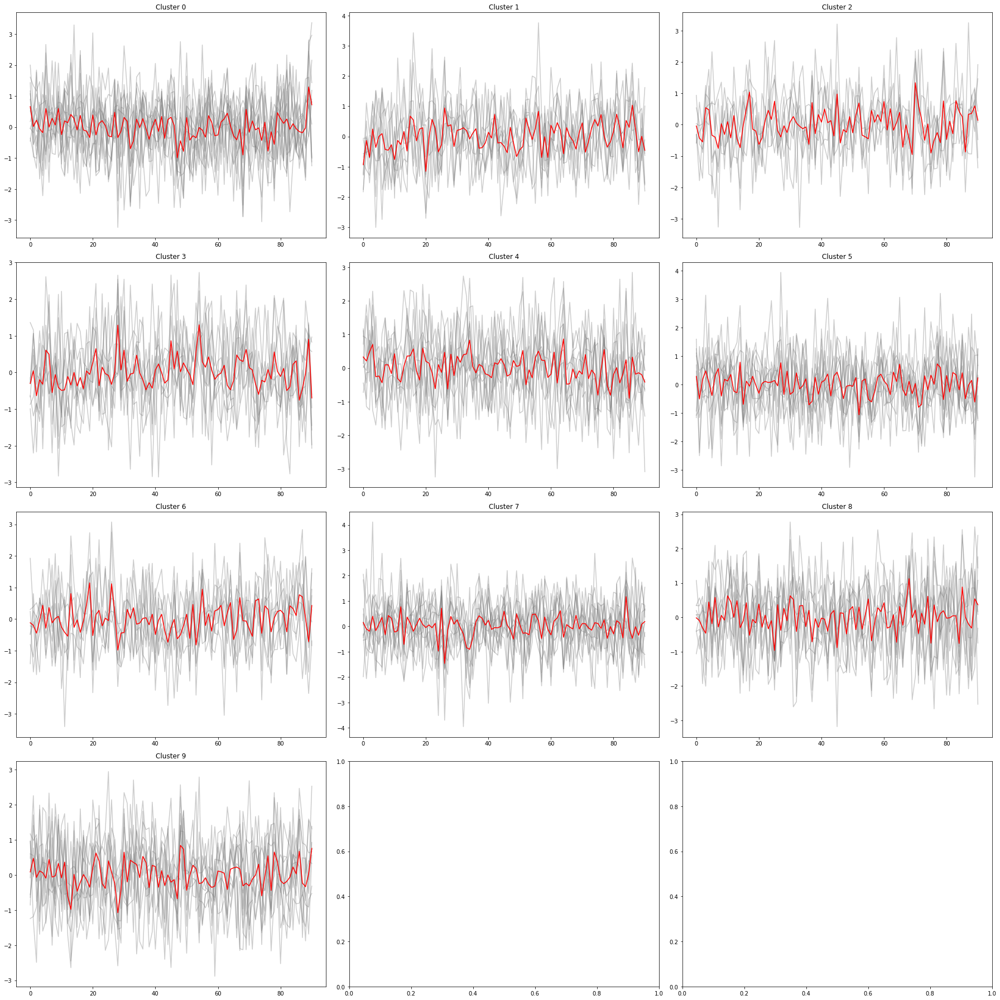

In [309]:
#plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(4,3,figsize=(25,25))
#fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels2):
    cluster = []
    for i in range(len(labels2)):
            if(labels2[i]==label):
                axs[row_i, column_j].plot(X_train[i],c="gray",alpha=0.4)
                cluster.append(X_train[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(km2.cluster_centers_[row_i*3+column_j].ravel(), "r-")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*3+column_j))
    column_j+=1
    if column_j%3 == 0:
        row_i+=1
        column_j=0
        
plt.show()

**==> Dans les figures ci-dessus, on a affiché les series temporelles appartenant à chaque classe en gris et le rouge représente le centre de chaque cluster**

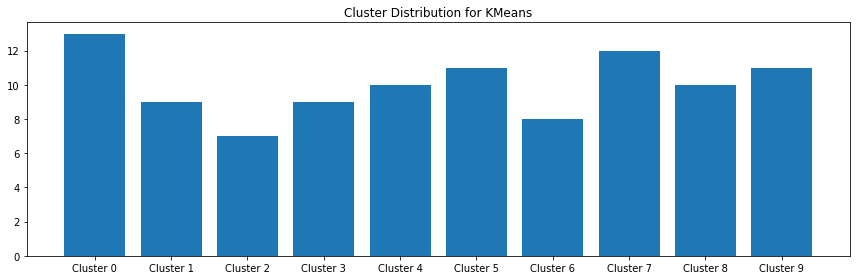

In [312]:
cluster_c2 = [len(labels2[labels2==i]) for i in range(cluster_count)]
cluster_n2 = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(12,4))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n2,cluster_c2)
plt.show()

### 2- SOM (Self-organizing maps)

**Pour rendre la carte carrée, on a choisi de calculer la racine carrée de la taille de la carte qui est la racine carrée du nombre de séries pour le nombre de lignes et de colonnes de som**

In [891]:
som_x = som_y = math.floor(math.sqrt(math.sqrt(len(X_train))))

x_train = X_train[:,:,0]
som = MiniSom(som_x, som_y,len(x_train[0]), sigma=0.3, learning_rate = 0.5)

#som.random_weights_init(x_train)
som.train(x_train, 100000)

**Nous allons calculer la serie temporelle moyenne représentant le centre de la classe avec la distance DTW!!**

In [892]:
from tslearn.barycenters import dtw_barycenter_averaging
def plot_som_series_dba_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(25,18))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(dtw_barycenter_averaging(np.vstack(win_map[cluster])),c="red") # I changed this part
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

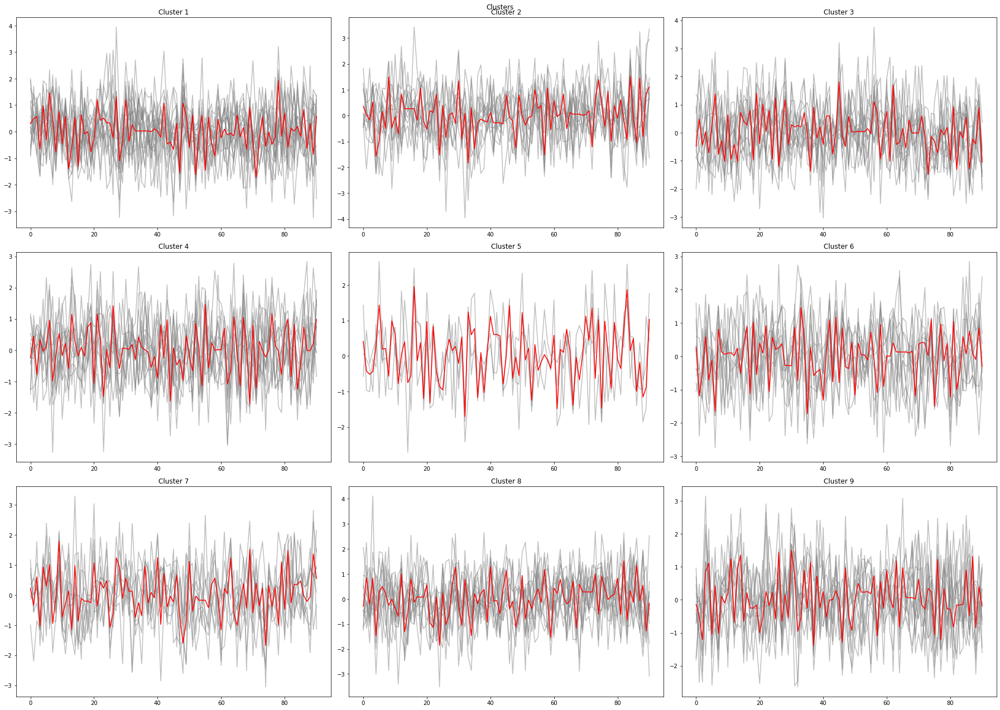

In [893]:
win_map = som.win_map(x_train)

plot_som_series_dba_center(som_x, som_y, win_map)

##### Cluster Distribution

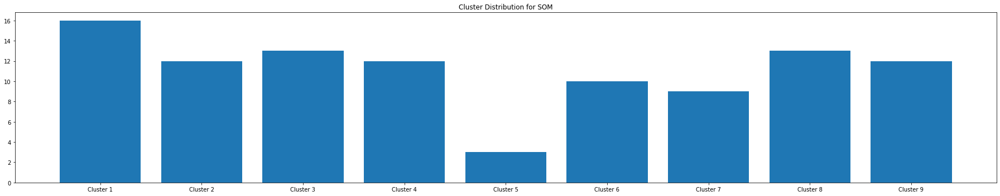

In [894]:
cluster_c = []
cluster_n = []
for x in range(som_x):
    for y in range(som_y):
        cluster = (x,y)
        if cluster in win_map.keys():
            cluster_c.append(len(win_map[cluster]))
        else:
            cluster_c.append(0)
        cluster_number = x*som_y+y+1
        cluster_n.append(f"Cluster {cluster_number}")

plt.figure(figsize=(25,5))
plt.title("Cluster Distribution for SOM")
plt.bar(cluster_n,cluster_c)
plt.show()

In [910]:
clus1 = win_map[(0,0)]
clus2 = win_map[(0,1)]
clus3 = win_map[(0,2)]
clus4 = win_map[(1,0)]
clus5 = win_map[(1,1)]
clus6 = win_map[(1,2)]
clus7 = win_map[(2,0)]
clus8 = win_map[(2,1)]
clus9 = win_map[(2,2)]

**Pour ne pas allourdir la figure ci-dessous, nous allons visualiser quelques series temporelles de classes différentes tout en essayant de trouver quelques dissemblance dans leurs comportements.**

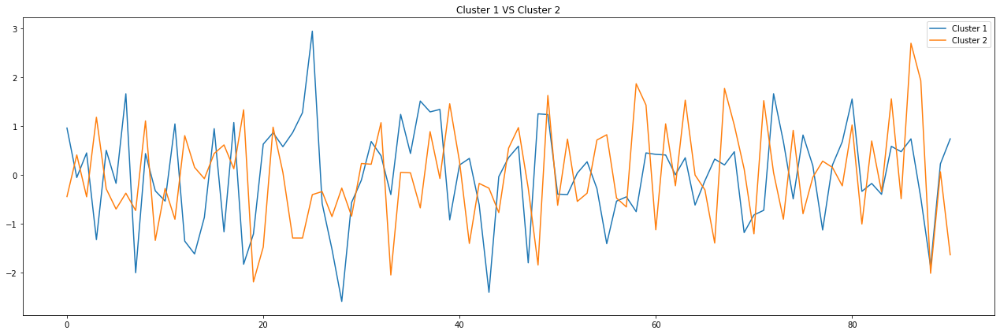

In [998]:
f = plt.figure(figsize=(35,6))
ax = f.add_subplot(121)
ax.plot((clus1[3]), label='Cluster 1')
ax.plot((clus2[0]), label='Cluster 2')
ax.set_title("Cluster 1 VS Cluster 2")
ax.legend()
plt.show()

 **On peut remarquer que la série temporelle de la classe 1 consomme moins d'éléctricité que celle de la classe 2 tout au long des 91jrs, sauf dans des cas particulier comme le jour 24.**

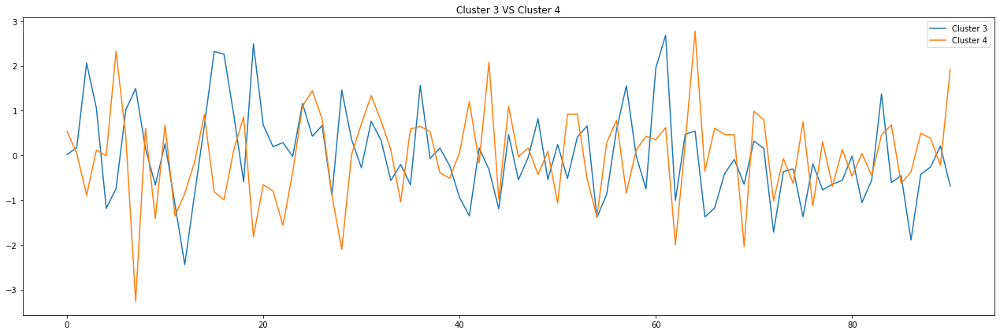

In [935]:
f = plt.figure(figsize=(35,6))
ax = f.add_subplot(121)
ax.plot((clus3[0]), label='Cluster 3')
ax.plot((clus4[0]), label='Cluster 4')
ax.set_title("Cluster 3 VS Cluster 4")
ax.legend()
plt.show()

**On peut remarquer que dans les premiers 40 jours, la serie temporelle de la classe 3 cosomme plus d'éléctricité que celle de la classe 4. Et dans le reste des jours, on remarque le contraire, le cluster 4 consomme plus d'éléctricité.**


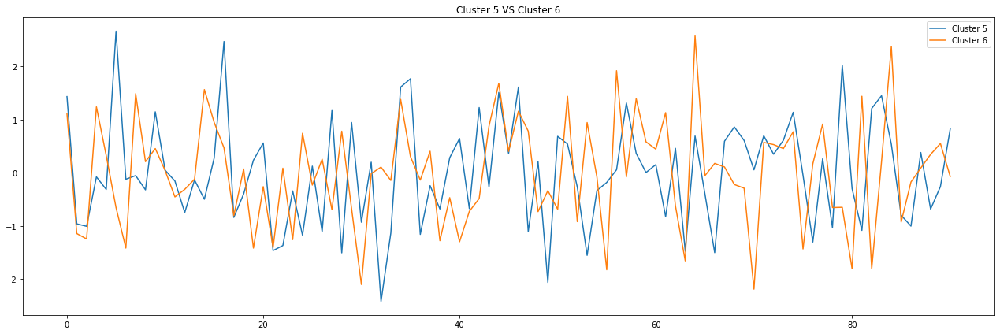

In [999]:
f = plt.figure(figsize=(35,6))
ax = f.add_subplot(121)
ax.plot((clus5[0]), label='Cluster 5')
ax.plot((clus6[1]), label='Cluster 6')
ax.set_title("Cluster 5 VS Cluster 6")
ax.legend()
plt.show()

**Remarque** : On constate que ce n'est pas évident de trouver les caractéristiques entre les classes obtenues  !!!!!!!!!!

### Clustering Ascendant Hierarchical

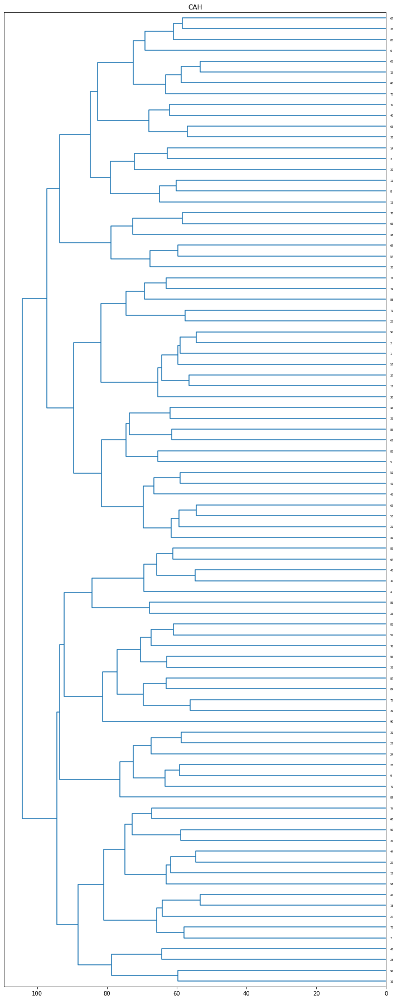

In [846]:
#librairies pour la CAH

from matplotlib import pyplot as plt

from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

#générer la matrice des liens

Z = linkage(ts_days[ts_days.columns[1:]].transpose(),method='ward',

      metric='euclidean')

#affichage du dendrogramme
plt.figure(figsize=(10,25))


plt.title("CAH")

dendrogram(Z,labels=ts_days[ts_days.columns[1:]].transpose().index,orientation='left',

      color_threshold=0)


plt.show()

D'apres le critère d'agrégation Dmin ,on aura 7 paratition , les differentes classes sont affichées dans le dendrogram au dessous

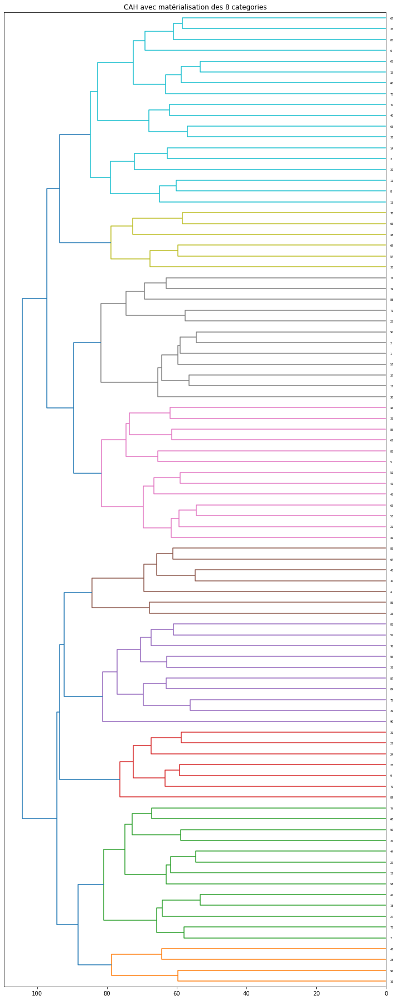

[7 7 9 5 6 9 2 9 3 5 9 2 9 9 9 1 7 2 7 7 6 3 3 3 7 5 2 1 2 8 3 9 6 2 9 4 7
 9 4 9 6 2 5 2 6 6 1 8 6 7 6 4 6 8 4 1 7 2 2 9 9 6 9 5 6 8 9 2 8 9 7 4 9 2
 7 4 2 8 3 9 4 6 5 4 6 5 4 7 3 4]


In [847]:

plt.figure(figsize=(10,25))

plt.title('CAH avec matérialisation des 8 categories')

dendrogram(Z,labels=ts_days[ts_days.columns[1:]].transpose().index,orientation='left',color_threshold=85)

plt.show()



groupes_cah = fcluster(Z,t=85,criterion='distance')

print(groupes_cah)

### ACP (Analyse des composantes principales)

In [1000]:
from sklearn.decomposition import PCA

# we will scale our time series (centre-reduit)
X_train = TimeSeriesScalerMeanVariance().fit_transform(ts_days) # Output dimension = 3 

# pass from dimesion 3 to dimension 2
ts_train = X_train[:,:,0] 

pca = PCA() #Nous souhaitons garder 90% de la variance.
pca_df= pd.DataFrame(pca.fit_transform(ts_train))
pca_df.head()

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
0,-2.536703,-1.711244,-0.396070,1.138117,1.382530,1.422558,3.219164,-3.788865,1.010102,0.699338,...,-0.094909,-0.128494,-0.105011,-0.194478,-0.135346,-0.167346,0.043982,0.005988,-0.018508,2.665771e-16
1,-0.949508,0.935426,1.322379,-0.332418,0.485684,2.519645,-2.783795,-1.917919,2.411188,0.059322,...,-0.120945,-0.120789,-0.184394,0.245229,0.099782,-0.094956,-0.017968,-0.024311,0.042341,1.656357e-16
2,-1.449939,3.528277,-5.031303,1.278479,-0.551389,-1.292935,0.638196,-0.484514,0.148604,-0.229197,...,-0.256104,0.388607,-0.100967,0.289848,-0.072391,-0.115239,0.109847,0.066385,-0.070216,-3.431308e-17
3,-0.584990,0.286948,0.793413,-2.095393,-1.953983,1.903917,1.053799,-0.648038,1.206277,0.352332,...,0.092025,-0.000865,0.292697,-0.229816,0.058251,0.070716,-0.016587,0.017802,0.006953,-3.130089e-16
4,-0.316927,1.170883,-0.741419,2.285010,-0.150408,0.816790,0.554726,0.574874,0.672469,-1.784787,...,0.037000,0.077495,-0.027815,-0.108951,0.186727,0.006461,0.018809,0.037722,0.038339,3.384481e-17


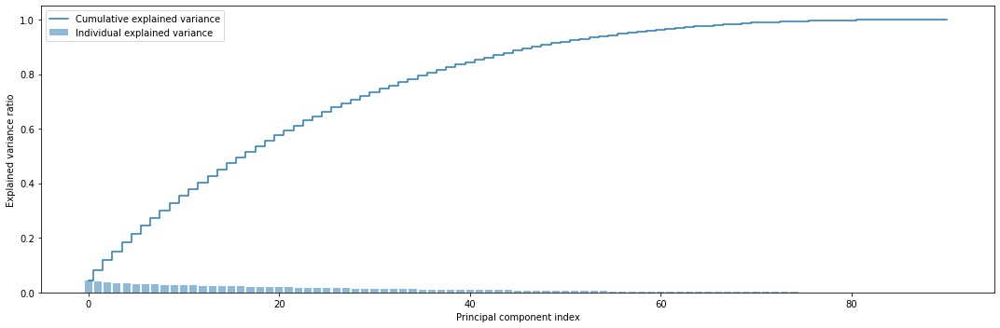

In [1001]:
plt.figure(figsize=(15,5))
# Determine explained variance using explained_variance_ration_ attribute
exp_var_pca = pca.explained_variance_ratio_
# Cumulative sum of eigenvalues; This will be used to create step plot for visualizing the variance explained by each principal component.

cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# Create the visualization plot

plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

95% de l'information est capté par 58 composantes principales 

Nous pensons donc à faire une classification automatique de notre nouvelle dataset avec le Kmeans(metric=DWT)

In [749]:
pca_df = pca_df.iloc[:,0:58]

In [752]:
# A good rule of thumb is choosing k as the square root of the number of points in the training data set
cluster_count = math.ceil(math.sqrt(len(pca_df))) 

km_pca = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels_pca = km_pca.fit_predict(pca_df)

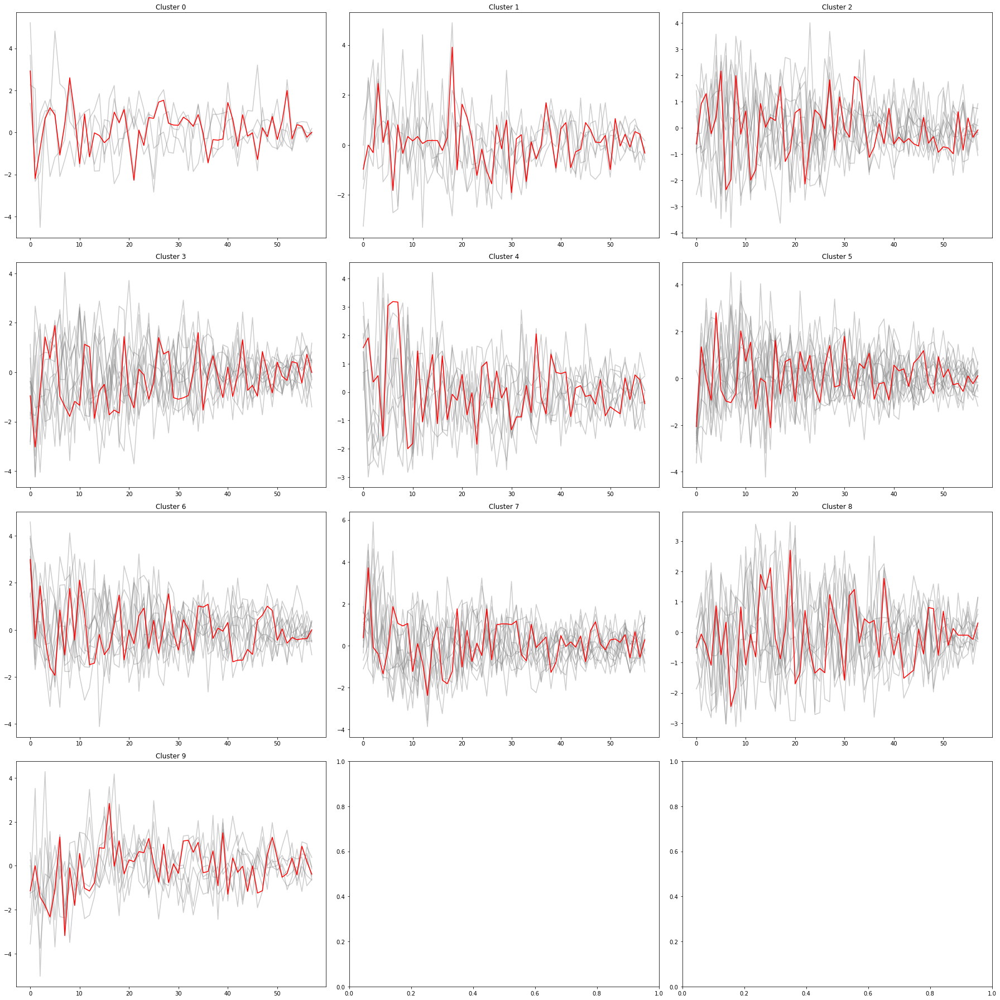

In [772]:
#plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(4,3,figsize=(25,25))
#fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels_pca):
    cluster = []
    for i in range(len(labels_pca)):
            if(labels_pca[i]==label):
                axs[row_i, column_j].plot(pca_df.iloc[i,:],c="gray",alpha=0.4)
                cluster.append(pca_df.iloc[i,:])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(km_pca.cluster_centers_[row_i*3+column_j].ravel(), "r-")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*3+column_j))
    column_j+=1
    if column_j%3 == 0:
        row_i+=1
        column_j=0
        
plt.show()

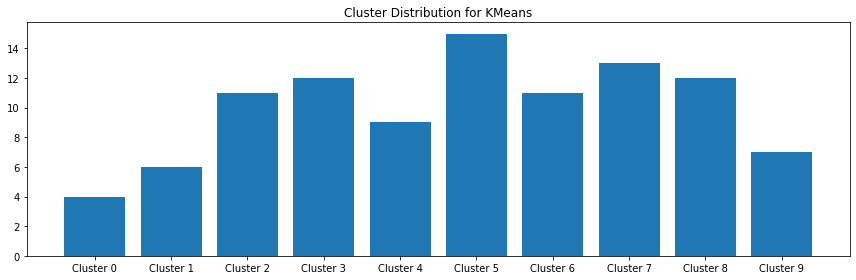

In [773]:
cluster_c_pca = [len(labels_pca[labels_pca==i]) for i in range(cluster_count)]
cluster_n_pca = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(12,4))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n_pca,cluster_c_pca)
plt.show()

Elbow 

<AxesSubplot:xlabel='clusters'>

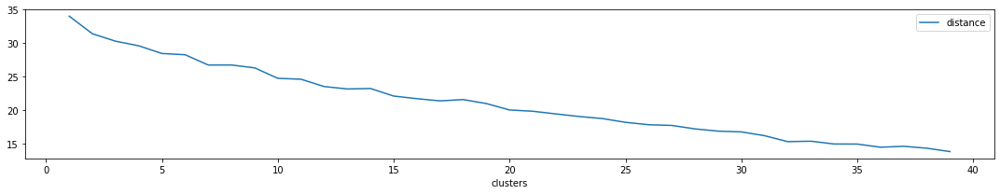

In [779]:
elbow_data = []
K = range(1,40)
for k in K:
    km_pca = TimeSeriesKMeans(n_clusters=k, metric="dtw")
    km_pca.fit(pca_df)
    elbow_data.append((k,km_pca.inertia_))

pd.DataFrame(elbow_data,columns=['clusters', 'distance']).plot(x='clusters',y='distance')

On remarque que la courbe commence à se stagner à partir du 32 clusters. On refait donc la classification sur un nombre de cluster égale à 32.

In [780]:
# A good rule of thumb is choosing k as the square root of the number of points in the training data set
cluster_count = math.ceil(math.sqrt(len(pca_df))) 

km_pca = TimeSeriesKMeans(n_clusters=32, metric="dtw")

labels_pca = km_pca.fit_predict(pca_df)

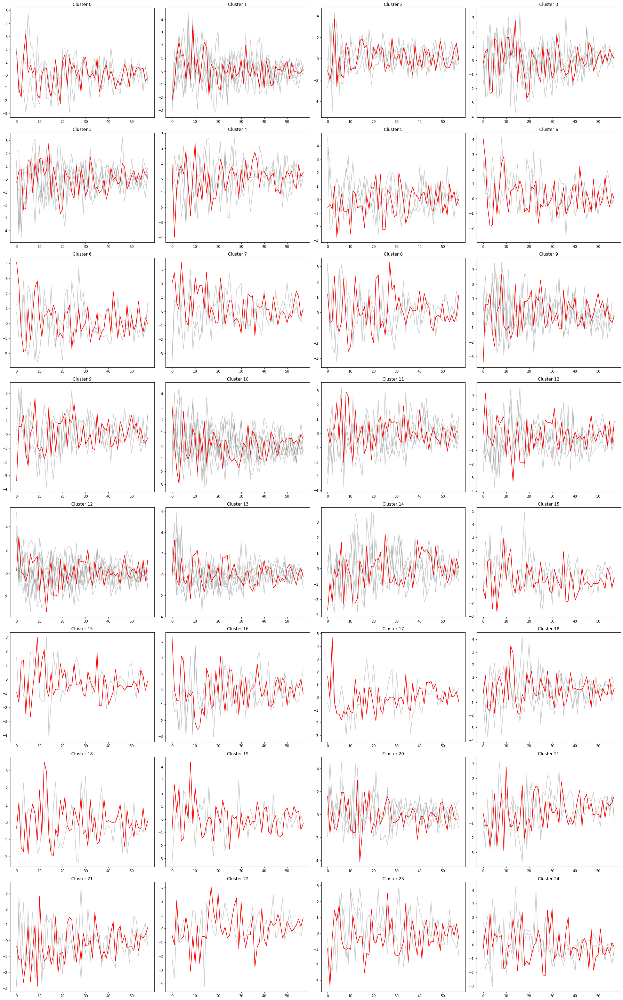

In [782]:
#plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(8,4,figsize=(25,40))
#fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels_pca):
    cluster = []
    for i in range(len(labels_pca)):
            if(labels_pca[i]==label):
                axs[row_i, column_j].plot(pca_df.iloc[i,:],c="gray",alpha=0.4)
                cluster.append(pca_df.iloc[i,:])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(km_pca.cluster_centers_[row_i*3+column_j].ravel(), "r-")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*3+column_j))
    column_j+=1
    if column_j%4 == 0:
        row_i+=1
        column_j=0
        
plt.show()

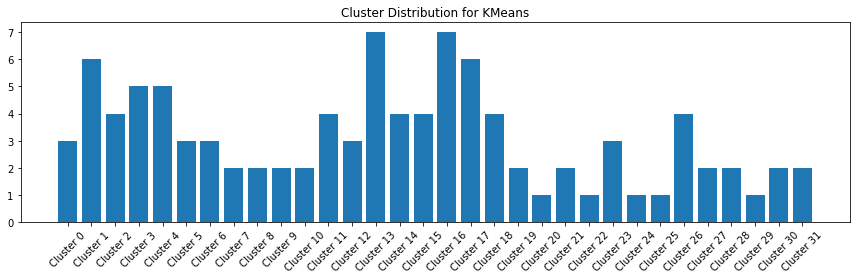

In [784]:
cluster_c_pca = [len(labels_pca[labels_pca==i]) for i in range(32)]
cluster_n_pca = ["Cluster "+str(i) for i in range(32)]
plt.figure(figsize=(12,4))
plt.title("Cluster Distribution for KMeans")
plt.xticks(rotation ='45')
plt.bar(cluster_n_pca,cluster_c_pca)
plt.show()

**Avec le ACP, on a pu obtenir des figures intéressante, mais il reste tojours délicat d'observer clairement le comportement de chaque classe. 
Il se peut que cette difficulté dépend aussi de l'ensemble de données qui n'est pas riche.**

## Segmentation


In [373]:
from pyts.utils import segmentation

### Decomposition de Fourrier

**On a affiché la transformation de Fourrier pour une série temporelle des 4 premiers Clusters.**

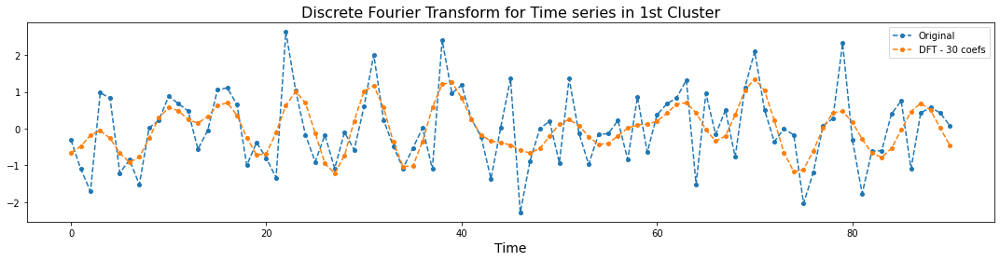

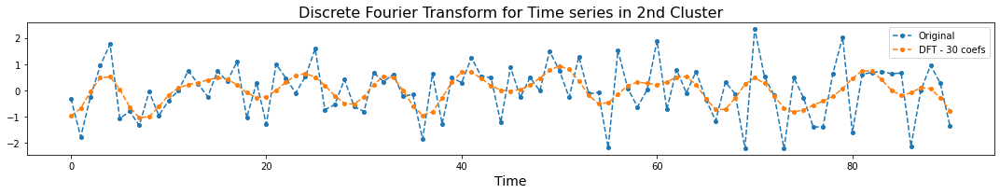

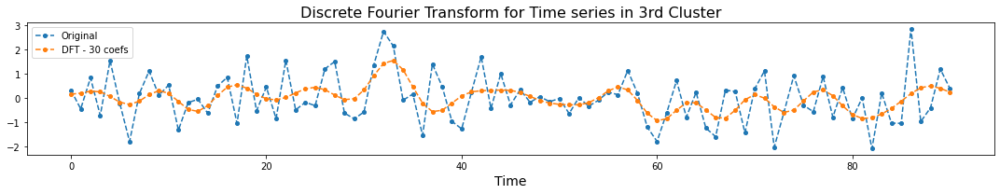

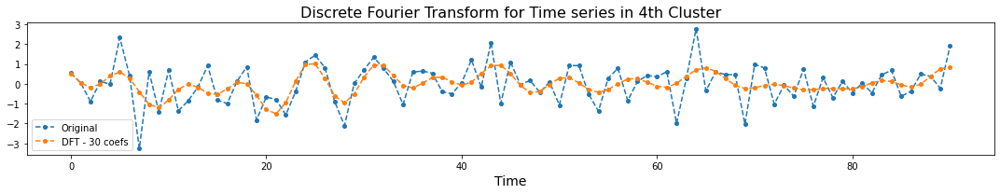

In [823]:

import numpy as np
import matplotlib.pyplot as plt
from pyts.approximation import DiscreteFourierTransform

# Parameters
n_samples, n_timestamps = X_train.shape[0], X_train.shape[1]

# DFT transformation
n_coefs = 30
dft = DiscreteFourierTransform(n_coefs=n_coefs, norm_mean=False,
                               norm_std=False)
X_dft = dft.fit_transform(X_train[:,:,0])

# Compute the inverse transformation
if n_coefs % 2 == 0:
    real_idx = np.arange(1, n_coefs, 2)
    imag_idx = np.arange(2, n_coefs, 2)
    X_dft_new = np.c_[
        X_dft[:, :1],
        X_dft[:, real_idx] + 1j * np.c_[X_dft[:, imag_idx],
                                        np.zeros((n_samples, ))]
    ]
else:
    real_idx = np.arange(1, n_coefs, 2)
    imag_idx = np.arange(2, n_coefs + 1, 2)
    X_dft_new = np.c_[
        X_dft[:, :1],
        X_dft[:, real_idx] + 1j * X_dft[:, imag_idx]
    ]
X_irfft = np.fft.irfft(X_dft_new, n_timestamps)

# Show the results for the first time series in first Cluster
plt.figure(figsize=(15, 4))
plt.plot(X_train[c1.index[0]], 'o--', ms=4, label='Original')
plt.plot(X_irfft[c1.index[0]], 'o--', ms=4, label='DFT - {0} coefs'.format(n_coefs))
plt.legend(loc='best', fontsize=10)
plt.xlabel('Time', fontsize=14)
plt.title('Discrete Fourier Transform for Time series in 1st Cluster', fontsize=16)
plt.show()

# Show the results for the first time series in Seconde Cluster
plt.plot(X_train[c2.index[0]], 'o--', ms=4, label='Original')
plt.plot(X_irfft[c2.index[0]], 'o--', ms=4, label='DFT - {0} coefs'.format(n_coefs))
plt.legend(loc='best', fontsize=10)
plt.xlabel('Time', fontsize=14)
plt.title('Discrete Fourier Transform for Time series in 2nd Cluster', fontsize=16)
plt.show()

# Show the results for the first time series in 3rd Cluster
plt.plot(X_train[c3.index[0]], 'o--', ms=4, label='Original')
plt.plot(X_irfft[c3.index[0]], 'o--', ms=4, label='DFT - {0} coefs'.format(n_coefs))
plt.legend(loc='best', fontsize=10)
plt.xlabel('Time', fontsize=14)
plt.title('Discrete Fourier Transform for Time series in 3rd Cluster', fontsize=16)
plt.show()
# Show the results for the first time series in 4th Cluster
plt.plot(X_train[c4.index[0]], 'o--', ms=4, label='Original')
plt.plot(X_irfft[c4.index[0]], 'o--', ms=4, label='DFT - {0} coefs'.format(n_coefs))
plt.legend(loc='best', fontsize=10)
plt.xlabel('Time', fontsize=14)
plt.title('Discrete Fourier Transform for Time series in 4th Cluster', fontsize=16)
plt.show()


 ### SAX (Symbolic Aggregate Approximation)

SAX est un moyen de transformer une série chronologique (une séquence de nombres) en une séquence de symboles. Cette implémentation prend un ensemble d’une ou plusieurs séries chronologiques comme entrée. Ensuite, il transforme la série chronologique en leur représentation SAX.

* Le SAX nécessite que les données soient centré-réduire, et il est bien notre cas.

### SAX using pyts package

Nous allons utiliser le SAX avec un nombre de bins égale à 3

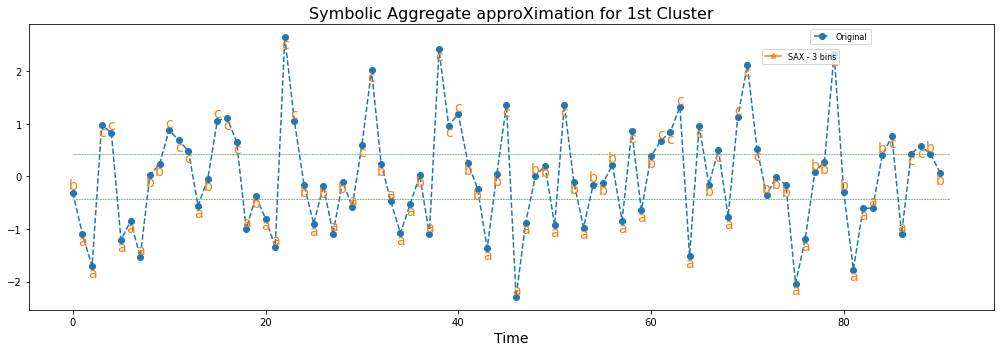

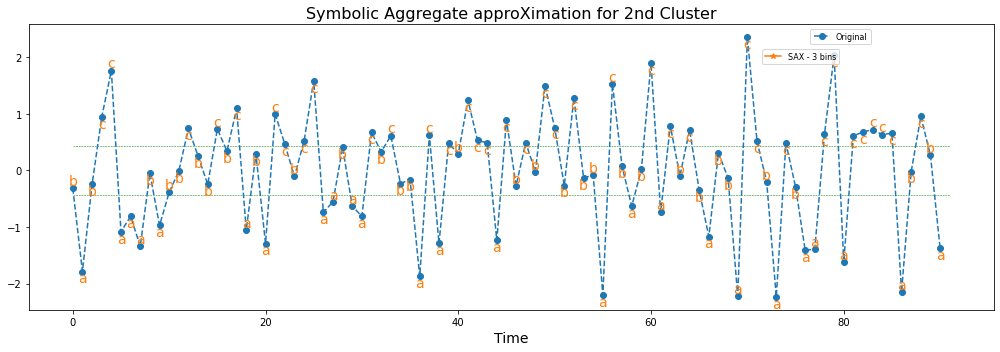

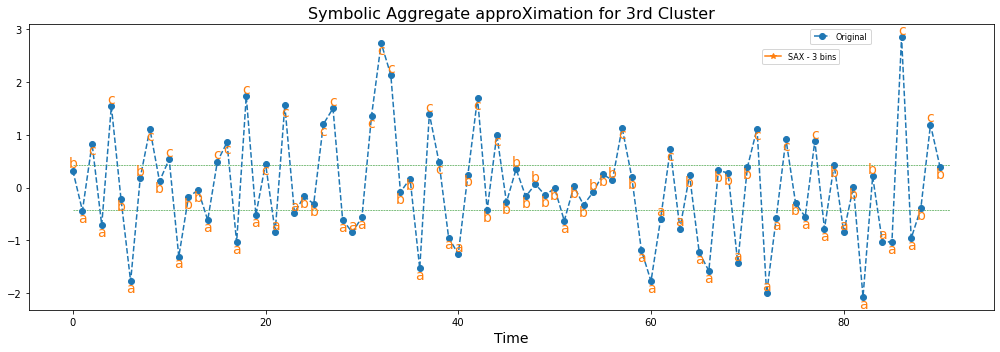

In [838]:

import numpy as np
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
from scipy.stats import norm
from pyts.approximation import SymbolicAggregateApproximation

# Parameters
n_samples, n_timestamps = X_train.shape[0], X_train.shape[1]


# SAX transformation
n_bins = 3
sax = SymbolicAggregateApproximation(n_bins=n_bins, strategy='normal')
X_sax = sax.fit_transform(X_train[:,:,0])

# Compute gaussian bins
bins = norm.ppf(np.linspace(0, 1, n_bins + 1)[1:-1])

# Show the results for the first time series
bottom_bool = np.r_[True, X_sax[0, 1:] > X_sax[0, :-1]]

plt.figure(figsize=(14, 5))
plt.plot(X_train[:,:,0][c1.index[0]], 'o--', label='Original')
for x, y, s, bottom in zip(range(n_timestamps), X_train[:,:,0][c1.index[0]], X_sax[c1.index[0]], bottom_bool):
    va = 'bottom' if bottom else 'top'
    plt.text(x, y, s, ha='center', va=va, fontsize=14, color='#ff7f0e')
plt.hlines(bins, 0, n_timestamps, color='g', linestyles='--', linewidth=0.5)
sax_legend = mlines.Line2D([], [], color='#ff7f0e', marker='*',
                           label='SAX - {0} bins'.format(n_bins))
first_legend = plt.legend(handles=[sax_legend], fontsize=8, loc=(0.76, 0.86))
ax = plt.gca().add_artist(first_legend)
plt.legend(loc=(0.81, 0.93), fontsize=8)
plt.xlabel('Time', fontsize=14)
plt.title('Symbolic Aggregate approXimation for 1st Cluster', fontsize=16)
plt.show()

plt.figure(figsize=(14, 5))
plt.plot(X_train[:,:,0][c2.index[0]], 'o--', label='Original')
for x, y, s, bottom in zip(range(n_timestamps), X_train[:,:,0][c2.index[0]], X_sax[c2.index[0]], bottom_bool):
    va = 'bottom' if bottom else 'top'
    plt.text(x, y, s, ha='center', va=va, fontsize=14, color='#ff7f0e')
plt.hlines(bins, 0, n_timestamps, color='g', linestyles='--', linewidth=0.5)
sax_legend = mlines.Line2D([], [], color='#ff7f0e', marker='*',
                           label='SAX - {0} bins'.format(n_bins))
first_legend = plt.legend(handles=[sax_legend], fontsize=8, loc=(0.76, 0.86))
ax = plt.gca().add_artist(first_legend)
plt.legend(loc=(0.81, 0.93), fontsize=8)
plt.xlabel('Time', fontsize=14)
plt.title('Symbolic Aggregate approXimation for 2nd Cluster', fontsize=16)
plt.show()

plt.figure(figsize=(14, 5))
plt.plot(X_train[:,:,0][c3.index[0]], 'o--', label='Original')
for x, y, s, bottom in zip(range(n_timestamps), X_train[:,:,0][c3.index[0]], X_sax[c3.index[0]], bottom_bool):
    va = 'bottom' if bottom else 'top'
    plt.text(x, y, s, ha='center', va=va, fontsize=14, color='#ff7f0e')
plt.hlines(bins, 0, n_timestamps, color='g', linestyles='--', linewidth=0.5)
sax_legend = mlines.Line2D([], [], color='#ff7f0e', marker='*',
                           label='SAX - {0} bins'.format(n_bins))
first_legend = plt.legend(handles=[sax_legend], fontsize=8, loc=(0.76, 0.86))
ax = plt.gca().add_artist(first_legend)
plt.legend(loc=(0.81, 0.93), fontsize=8)
plt.xlabel('Time', fontsize=14)
plt.title('Symbolic Aggregate approXimation for 3rd Cluster', fontsize=16)
plt.show()

**On a appliqué le SAX sur tous les series temporelles, et par la suite on a affiché 3 exemples de classes différentes.**

### SAX using tslearn package

In [1011]:
from tslearn.piecewise import PiecewiseAggregateApproximation, SymbolicAggregateApproximation

In [1021]:
sax = SymbolicAggregateApproximation(n_segments=20, alphabet_size_avg=3, )
sax_data = sax.fit_transform(X_train)

In [1022]:
sax_data.shape

(100, 20, 1)

In [1023]:
sax_dataset_inv = sax.inverse_transform(sax_data)

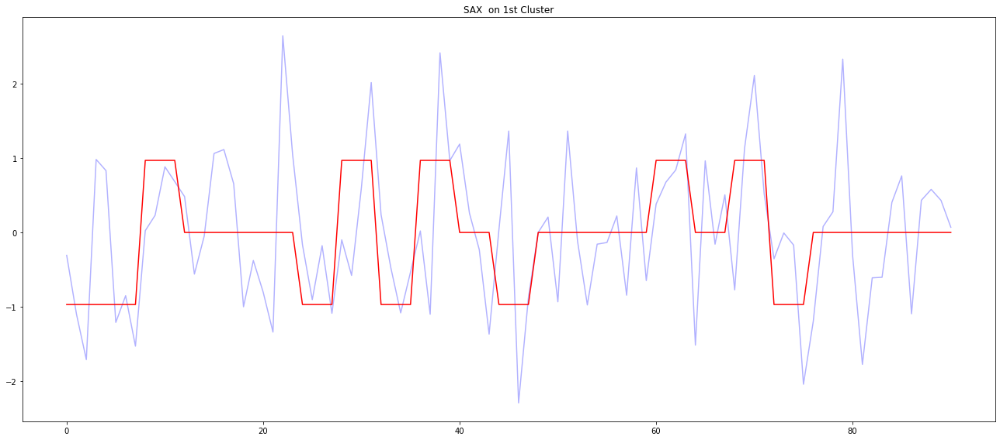

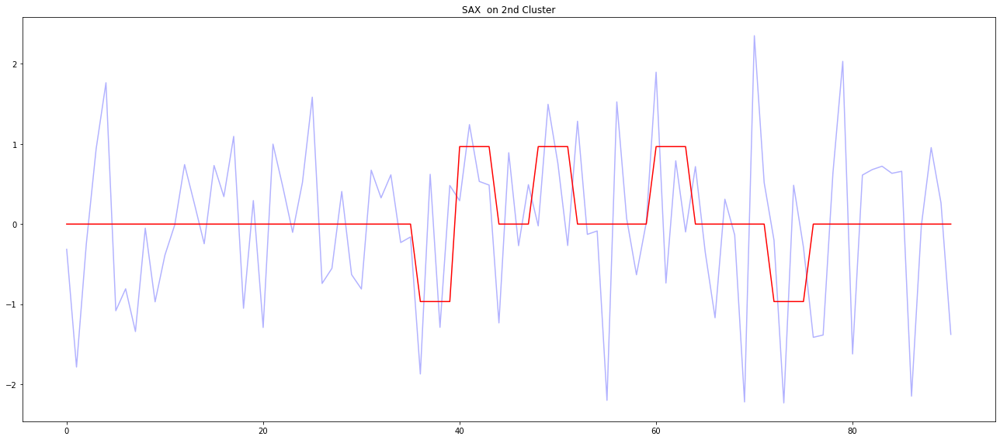

In [1029]:
plt.plot(X_train[c1.index[0]].ravel(), "b-", alpha=0.3)
plt.plot(sax_dataset_inv[c1.index[0]].ravel(), "r-")
plt.title("SAX  on 1st Cluster")
plt.show()
### Second Cluster
plt.plot(X_train[c2.index[0]].ravel(), "b-", alpha=0.3)
plt.plot(sax_dataset_inv[c2.index[0]].ravel(), "r-")
plt.title("SAX  on 2nd Cluster")
plt.show()

#### Package Ruptures

ruptures est une bibliothèque Python pour la détection de points de changement hors ligne. Ce package fournit des méthodes pour l'analyse et la segmentation de signaux non stationnaires. Les algorithmes implémentés incluent la détection exacte et approximative pour divers modèles paramétriques et non-paramétriques. ruptures se concentre sur la facilité d'utilisation en fournissant une interface bien documentée et cohérente.

Ce package utilise la méthode de recherche basée sur la programmation dynamique.


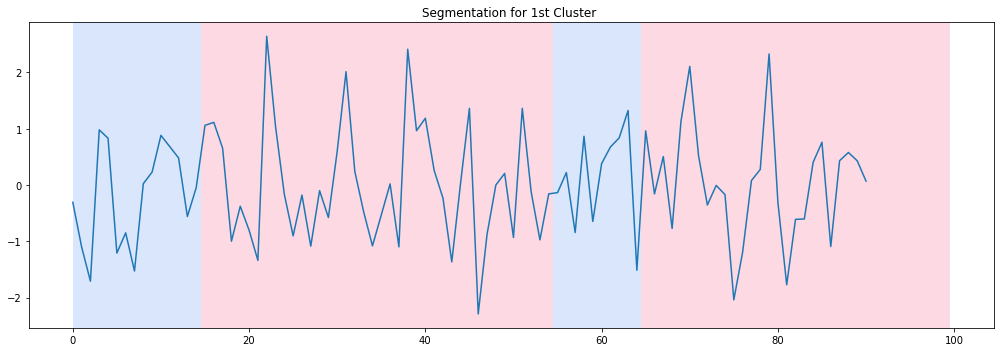

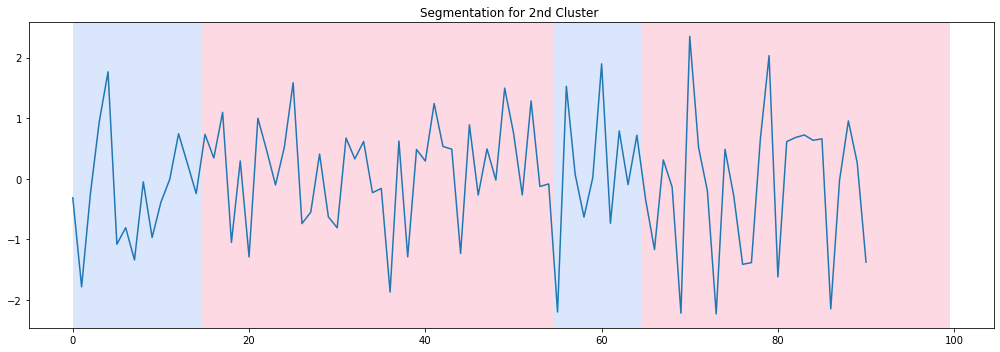

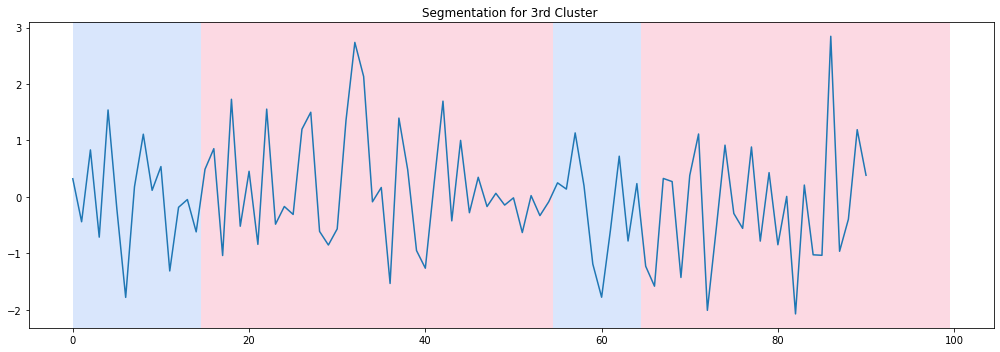

In [1026]:
import numpy as np
import matplotlib.pylab as plt
import ruptures as rpt


# change point detection
model = "l1"  
algo = rpt.Dynp(model=model, min_size=3, jump=5, custom_cost=c).fit(X_train)
my_bkps = algo.predict(n_bkps=3)

# show results
rpt.show.display(X_train[c1.index[0],:,0], my_bkps, figsize=(14, 5))
plt.title("Segmentation for 1st Cluster ")
plt.show()
rpt.show.display(X_train[c2.index[0],:,0], my_bkps, figsize=(14, 5))
plt.title("Segmentation for 2nd Cluster ")
plt.show()
rpt.show.display(X_train[c3.index[0],:,0], my_bkps, figsize=(14, 5))
plt.title("Segmentation for 3rd Cluster ")
plt.show()

#### PELT

**Détection pénalisée des points de changement.**

**Pour un modèle et un niveau de pénalité donnés, il calcule la segmentation qui minimise la somme contrainte des erreurs d'approximation.**

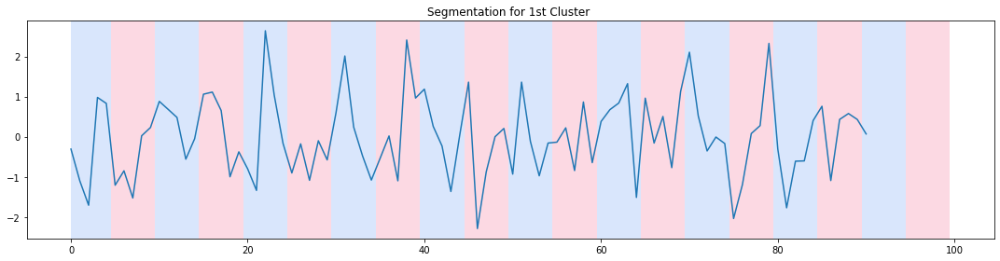

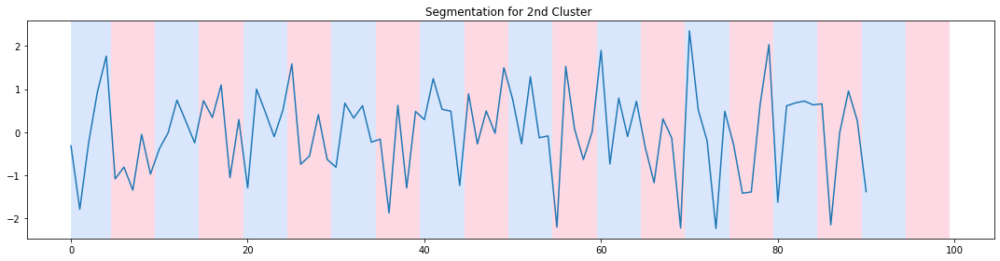

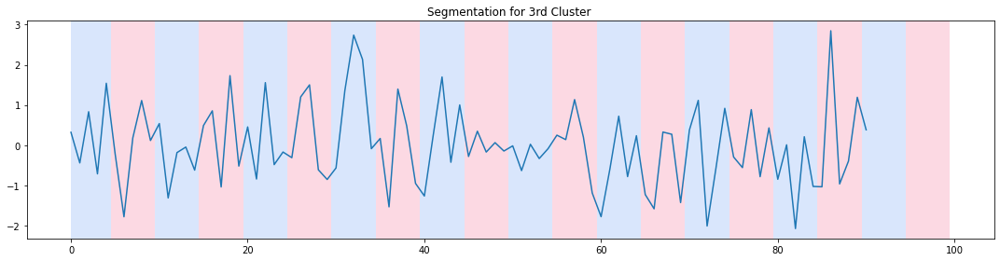

In [1027]:
# change point detection
c = rpt.costs.CostL2()
model = "l1"  
algo = rpt.Pelt(model=model, min_size=3, jump=5,custom_cost=c).fit(X_train[:,:,0])
my_bkps = algo.predict(pen=3)

# show results
fig, (ax,) = rpt.display(X_train[c1.index[0],:,0], my_bkps, figsize=(15, 4))
plt.title("Segmentation for 1st Cluster ")
plt.show()
fig, (ax,) = rpt.display(X_train[c2.index[0],:,0], my_bkps, figsize=(15, 4))
plt.title("Segmentation for 2nd Cluster ")
plt.show()
fig, (ax,) = rpt.display(X_train[c3.index[0],:,0], my_bkps, figsize=(15, 4))
plt.title("Segmentation for 3rd Cluster ")
plt.show()